<a href="https://colab.research.google.com/github/vivobino/computer-vision-project/blob/main/face_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 34.8 MB/s eta 0:00:00
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Enter your name --> vivian


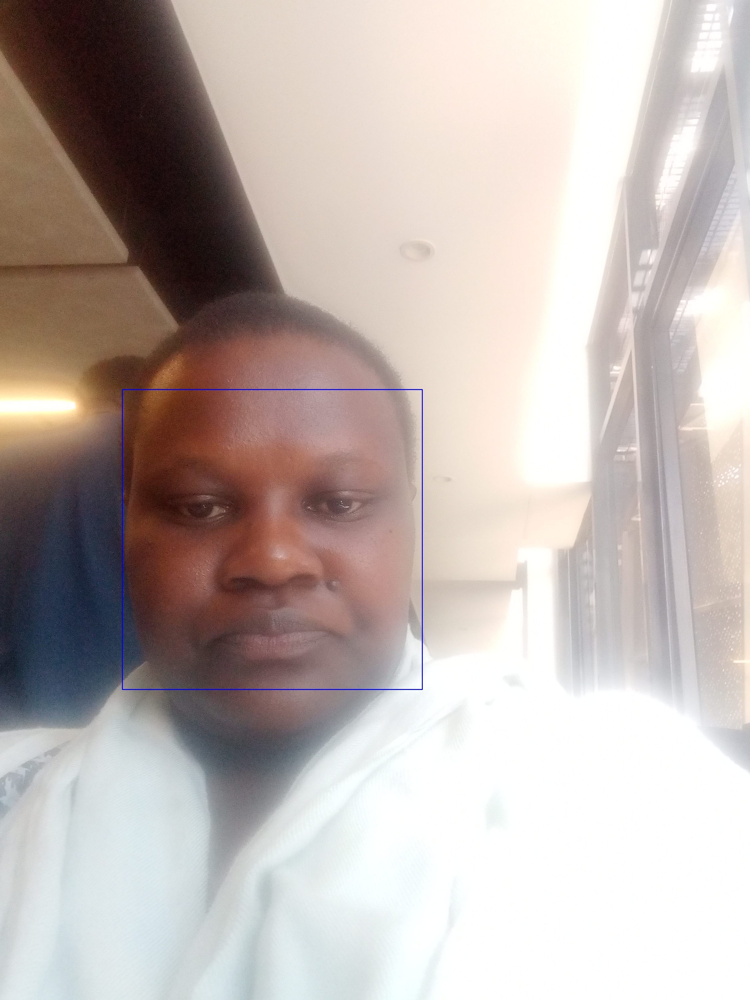

In [ ]:
!pip install google-colab
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')
import os
import cv2
import pickle
import numpy as np
import time

# Define directory for loading images
image_directory = '/content/drive/MyDrive/traindata '

face_data = []
facecascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

name = input('Enter your name --> ')

# Loop through images in the directory
for file_name in os.listdir(image_directory):
    if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(image_directory, file_name)
        frame = cv2.imread(image_path)

        if frame is not None:
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            face_coordinates = facecascade.detectMultiScale(gray, 1.3, 4)

            for (a, b, w, h) in face_coordinates:
                faces = frame[b:b+h, a:a+w, :]
                resized_faces = cv2.resize(faces, (50, 50))

                if len(face_data) < 10:
                    face_data.append(resized_faces)
                cv2.rectangle(frame, (a, b), (a+w, b+h), (255, 0, 0), 2)

            cv2_imshow(frame)
            time.sleep(1)
            if len(face_data) >= 10:  # Display each image for 1 second
                break



# Convert face data to a numpy array
face_data = np.asarray(face_data)
face_data = face_data.reshape(len(face_data), -1)

# Create data directory if it doesn't exist
if not os.path.exists('data'):
    os.makedirs('data')

# Save names
if 'names.pkl' not in os.listdir('data/'):
    names = [name] * len(face_data)
    with open('data/names.pkl', 'wb') as file:
        pickle.dump(names, file)
else:
    with open('data/names.pkl', 'rb') as file:
        names = pickle.load(file)

    names = names + [name] * len(face_data)
    with open('data/names.pkl', 'wb') as file:
        pickle.dump(names, file)

# Save faces
if 'faces.pkl' not in os.listdir('data/'):
    with open('data/faces.pkl', 'wb') as w:
        pickle.dump(face_data, w)
else:
    with open('data/faces.pkl', 'rb') as w:
        faces = pickle.load(w)

    faces = np.append(faces, face_data, axis=0)
    with open('data/faces.pkl', 'wb') as w:
        pickle.dump(faces, w)


In [ ]:
import cv2
from sklearn.neighbors import KNeighborsClassifier
import pickle
import numpy as np

facecascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

with open('data/faces.pkl', 'rb') as w:
    faces = pickle.load(w)

with open('data/names.pkl', 'rb') as file:
    labels = pickle.load(file)

camera = cv2.VideoCapture(0)

print('Shape of Faces matrix --> ', faces.shape)
knn = KNeighborsClassifier(n_neighbors=4)
knn.fit(faces,labels)

while True:
    ret, frame = camera.read()
    if ret == True:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        face_coordinates = facecascade.detectMultiScale(gray, 1.3, 5)

        for (a, b, w, h) in face_coordinates:
            fc = frame[b:b + h, a:a + w, :]
            r = cv2.resize(fc, (50, 50)).flatten().reshape(1,-1)
            text = knn.predict(r)
            cv2.putText(frame, text[0], (a, b-10), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 0), 2)
            cv2.rectangle(frame, (a, b), (a + w, b + w), (0, 0, 255), 2)

        cv2.imshow('livetime face recognition', frame)
        if cv2.waitKey(1) == 27:
            break
    else:
        print("error")
        break


camera.release()

In [ ]:
import os
import cv2
import pickle
import numpy as np
from sklearn.metrics import accuracy_score, classification_report
from sklearn.neighbors import KNeighborsClassifier

# Load the KNN model
with open('data/faces.pkl', 'rb') as w:
    faces = pickle.load(w)

with open('data/names.pkl', 'rb') as file:
    labels = pickle.load(file)

# Train KNN model
knn = KNeighborsClassifier(n_neighbors=4)
knn.fit(faces, labels)

# Path to test images
test_image_directory = '/content/drive/MyDrive/traindata '

# Preparing test data
test_faces = []
test_labels = []

for file_name in os.listdir(test_image_directory):
    if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
        label = file_name.split('_')[0]  # Assuming test image files are named as "label_xxx.jpg"
        image_path = os.path.join(test_image_directory, file_name)
        frame = cv2.imread(image_path)

        if frame is not None:
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            facecascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
            face_coordinates = facecascade.detectMultiScale(gray, 1.3, 5)

            for (a, b, w, h) in face_coordinates:
                fc = frame[b:b + h, a:a + w, :]
                resized_face = cv2.resize(fc, (50, 50)).flatten()
                test_faces.append(resized_face)
                test_labels.append(label)

# Convert test data to numpy arrays
test_faces = np.asarray(test_faces)
test_labels = np.asarray(test_labels)

# Predict using the KNN model
predictions = knn.predict(test_faces)

# Evaluate model performance
accuracy = accuracy_score(test_labels, predictions)
print(f"Accuracy: {accuracy * 100:.2f}%")
print("\nClassification Report:")
print(classification_report(test_labels, predictions))

# Display results on images
for i, file_name in enumerate(os.listdir(test_image_directory)):
    if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(test_image_directory, file_name)
        frame = cv2.imread(image_path)

        if frame is not None:
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            facecascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
            face_coordinates = facecascade.detectMultiScale(gray, 1.3, 5)

            for (a, b, w, h) in face_coordinates:
                label = predictions[i]
                cv2.putText(frame, label, (a, b - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 0), 2)
                cv2.rectangle(frame, (a, b), (a + w, b + h), (0, 0, 255), 2)

            cv2_imshow(frame)
            time.sleep(1)  # Display each test image for 1 second

cv2.destroyAllWindows()
